In [2]:
import pandas as pd
import numpy as np

In [13]:
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

In [12]:
%pip install scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.0/11.0 MB 8.2 MB/s eta 0:00:00 0:00:01m
Note: you may need to restart the kernel to use updated packages.


In [107]:
def preprocess_data(df):
    df_cleaned = df.copy()
    df_cleaned = df_cleaned.dropna(how='any') # drop empty columns

    numeric_columns = df_cleaned.select_dtypes(include=['float64', 'int64']).columns
    scaler = StandardScaler()
    df_cleaned[numeric_columns] = scaler.fit_transform(df_cleaned[numeric_columns])

    df_cleaned['result'] = (df_cleaned['goals_scored'] > df_cleaned['goals_conceded']).astype(int)
    
    # Create categorical result column (win, draw, loss)
    df_cleaned['result_category'] = 'draw'
    df_cleaned.loc[df_cleaned['goals_scored'] > df_cleaned['goals_conceded'], 'result_category'] = 'win'
    df_cleaned.loc[df_cleaned['goals_scored'] < df_cleaned['goals_conceded'], 'result_category'] = 'loss'
    
    return df_cleaned



In [15]:
import matplotlib.pyplot as plt

In [20]:
import seaborn as sns

In [21]:
def visualise(df):
    correlation_matrix = df.corr()
    
    plt.figure(figsize = (12, 10))
    sns.heatmap(correlation_matrix, annot = True, cmap = 'coolwarm')
    plt.title("Correlation Matrix")
    plt.show()

In [31]:
df = pd.read_csv('CCFC_match_lineups_data.csv')

In [108]:
df = preprocess_data(df)

In [45]:
def visualise_correlation_matrix(df):
    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
    correlation_matrix = df[numeric_columns].corr()
    plt.figure(figsize=(120, 100))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
    plt.title('Correlation Matrix for Numerical Features')
    plt.show()

In [44]:
plt.rcParams.update({'font.size': 32})

visualise_correlation_matrix(df)

In [50]:
def visualise_box_plots(df):
    plt.figure(figsize=(15,10))
    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
    sns.boxplot(data=df[numeric_columns])
    plt.title("Box plot for Numerical Features")
    plt.xticks(rotation=90)
    plt.show()

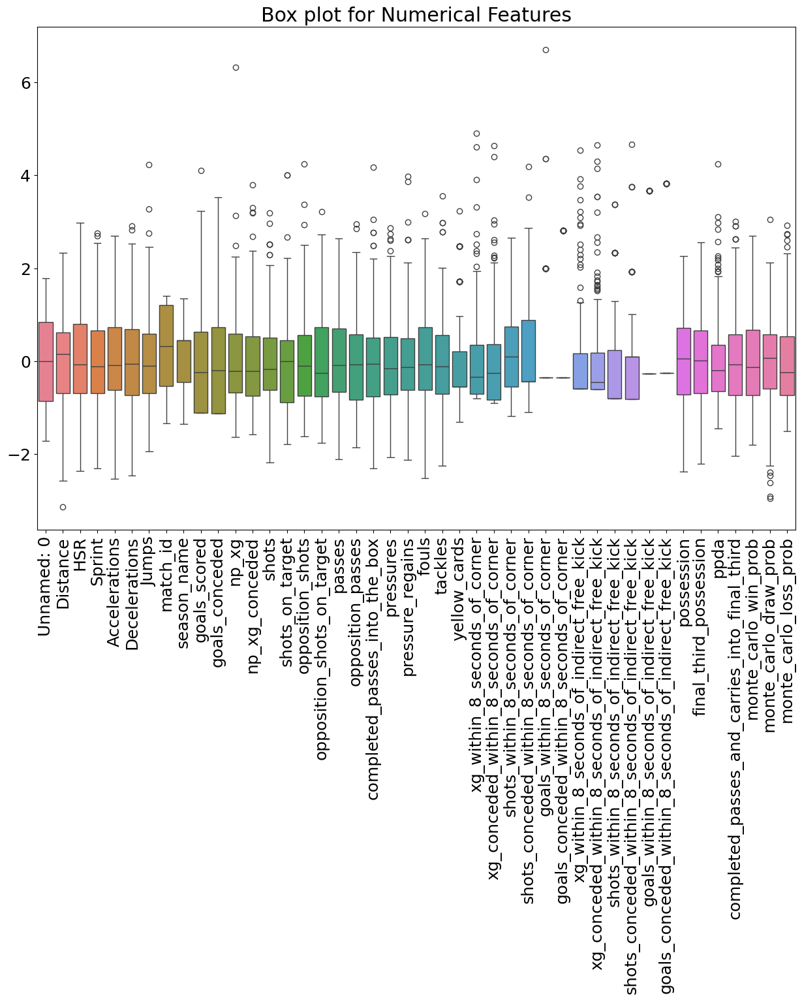

In [52]:
plt.rcParams.update({'font.size': 18})

visualise_box_plots(df)

In [99]:
def visualise_distributions(df):
    plt.figure(figsize=(65,10))
    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
    for i, col in enumerate(numeric_columns):
        plt.subplot(9, 5, i+1)
        sns.histplot(df[col], kde=True)
        plt.title(f'{col}')
    plt.tight_layout()
    plt.show()

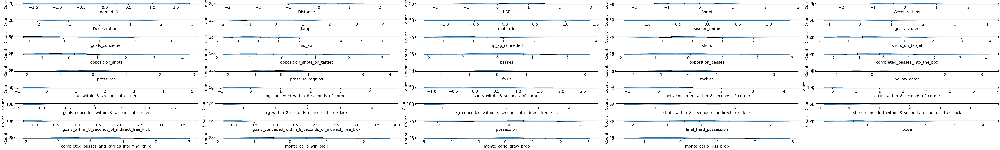

In [100]:
visualise_distributions(df)

In [112]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def create_analysis_visualizations(df, output_cols=None):
    """
    Creates a comprehensive set of visualizations for football statistics analysis.
    
    Parameters:
    df: pandas DataFrame containing football statistics
    output_cols: list of specific columns to analyze (defaults to all numeric columns)
    """
    # If no columns specified, use all numeric columns except the target
    if output_cols is None:
        output_cols = df.select_dtypes(include=[np.number]).columns
        output_cols = [col for col in output_cols if col != 'result']

    # Create figure for distribution comparisons
    n_cols = 3
    n_rows = (len(output_cols) + n_cols - 1) // n_cols
    fig_height = 5 * n_rows
    
    # 1. Win/Loss Distributions
    plt.figure(figsize=(20, fig_height))
    for idx, col in enumerate(output_cols):
        plt.subplot(n_rows, n_cols, idx + 1)
        sns.kdeplot(data=df, x=col, hue='result', common_norm=False)
        plt.title(f'{col} Distribution by Result')
        plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    # 2. Box Plots
    plt.figure(figsize=(20, 10))
    data_melted = df[output_cols].melt()
    sns.boxplot(data=data_melted, x='variable', y='value')
    plt.xticks(rotation=90)
    plt.title('Distribution of Features (Box Plots)')
    plt.tight_layout()
    plt.show()

    # 3. Correlation Heatmap (focusing on most important correlations)
    corr_matrix = df[output_cols + ['result']].corr()
    
    # Get correlations with target
    target_corr = abs(corr_matrix['result']).sort_values(ascending=False)
    top_features = target_corr[1:16].index  # top 15 features + target
    
    plt.figure(figsize=(120, 100))
    sns.heatmap(corr_matrix.loc[top_features, top_features], 
                annot=True, 
                cmap='coolwarm', 
                center=0,
                fmt='.2f')
    plt.title('Correlation Heatmap (Top 15 Features)')
    plt.tight_layout()
    plt.show()

    # 4. Feature Importance Plot (based on correlation with target)
    plt.figure(figsize=(12, 8))
    target_corr[1:16].plot(kind='bar')
    plt.title('Absolute Correlation with Match Result')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    return {
        'target_correlations': target_corr,
        'correlation_matrix': corr_matrix
    }

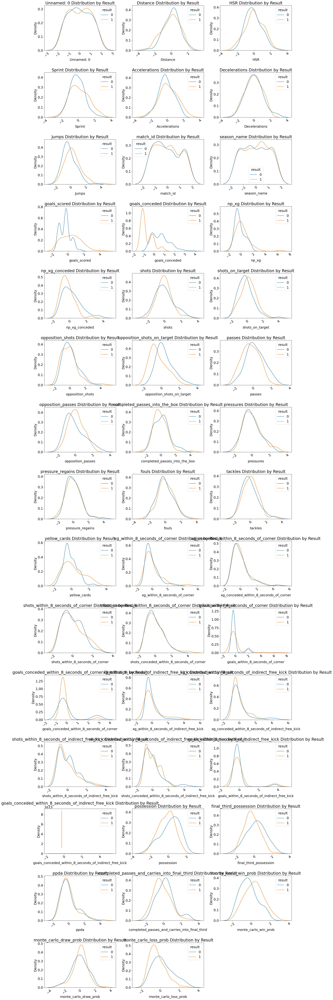

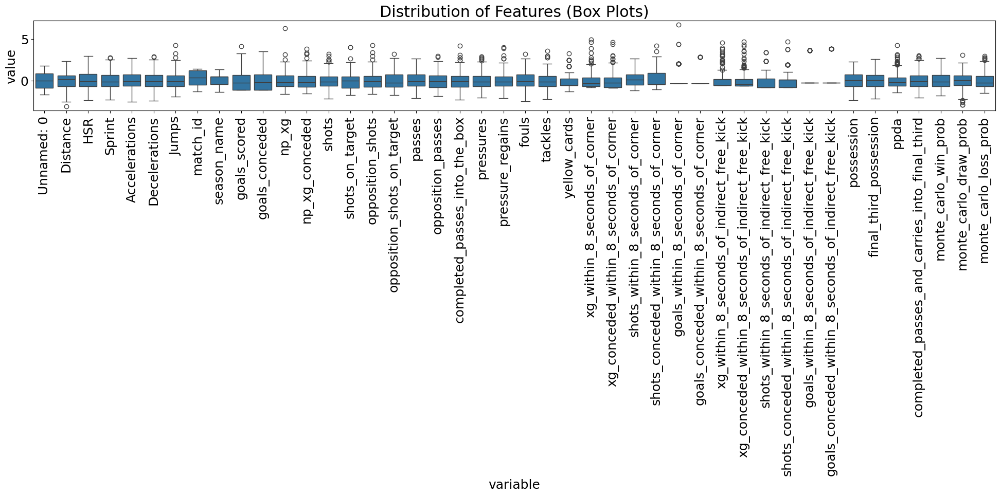

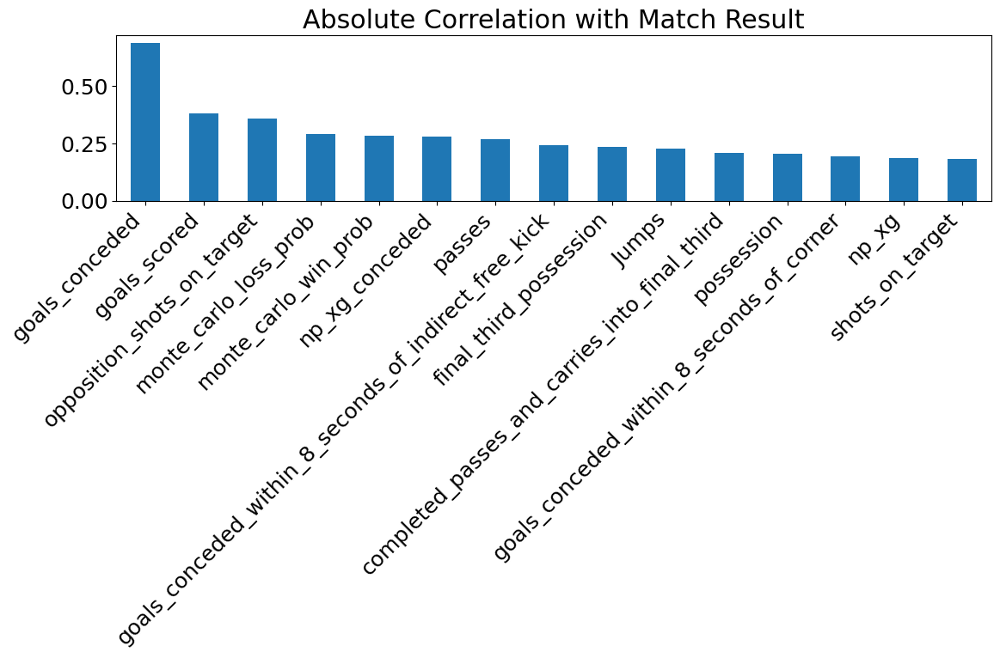

{'target_correlations': result                                                   1.000000
 goals_conceded                                           0.686847
 goals_scored                                             0.383157
 opposition_shots_on_target                               0.357759
 monte_carlo_loss_prob                                    0.293171
 monte_carlo_win_prob                                     0.284869
 np_xg_conceded                                           0.278216
 passes                                                   0.270186
 goals_conceded_within_8_seconds_of_indirect_free_kick    0.241635
 final_third_possession                                   0.234053
 Jumps                                                    0.228566
 completed_passes_and_carries_into_final_third            0.208845
 possession                                               0.204201
 goals_conceded_within_8_seconds_of_corner                0.192270
 np_xg                                 

In [113]:
create_analysis_visualizations(df)

In [114]:
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif

In [126]:
def perform_univariate_selection(x, y, feature_names, k=20):
    f_selector = SelectKBest(score_func=f_classif, k=k)
    f_selector.fit(X, y)
    f_scores = pd.DataFrame({
        'Feature': feature_names,
        'Score': f_selector.scores_,
        'F_Pvalue': f_selector.pvalues_
    })
    f_scores = f_scores.sort_values('Score', ascending=False)

    mi_selector = SelectKBest(score_func=mutual_info_classif, k=k)
    mi_selector.fit(X, y)
    mi_scores = pd.DataFrame({
        'Feature': feature_names,
        'Score': mi_selector.scores_
    })
    mi_scores = mi_scores.sort_values('Score', ascending=False)

    plt.figure(figsize=(30,16))

    plt.subplot(1, 2, 1)
    plt.barh(f_scores.head(10)['Feature'], f_scores.head(10)['Score'])
    plt.title('Top 10 Features by F-Score')
    plt.xlabel('F-Score')
    
    # Mutual Information scores plot
    plt.subplot(1, 2, 2)
    plt.barh(mi_scores.head(10)['Feature'], mi_scores.head(10)['Score'])
    plt.title('Top 10 Features by Mutual Information')
    plt.xlabel('Mutual Information Score')

    plt.tight_layout()
    plt.show()

    return f_scores, mi_scores

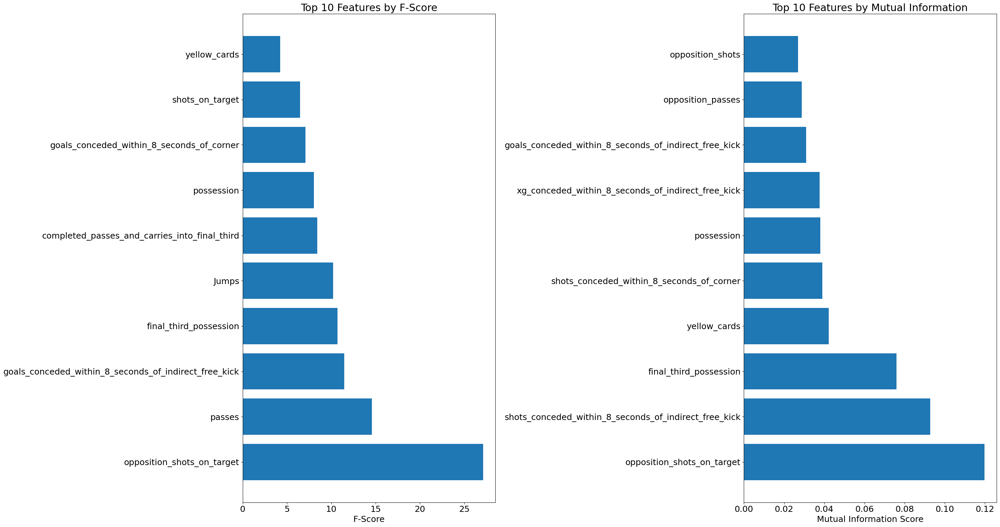

In [157]:
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns
columns_to_remove = [
    'monte_carlo_win_prob',
    'monte_carlo_draw_prob',
    'monte_carlo_loss_prob',
    'goals_scored',
    'goals_conceded',
    'np_xg',
    'np_xg_conceded',
    'season_name',
    'Unnamed: 0',
    'result'
]
X = df[numeric_columns].drop(columns_to_remove, axis=1)
y = df['result']
feature_names = X.columns
f_scores, mi_scores = perform_univariate_selection(X, y, feature_names)


In [158]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier

In [159]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

rfe = RFE(estimator=rf_model, n_features_to_select=15)

In [160]:
X_rfe = rfe.fit_transform(X, y)

In [161]:
feature_ranks = pd.Series(rfe.ranking_, index=X.columns)
feature_ranks.sort_values(ascending=True, inplace=True)
selected_features = feature_ranks.index[:15]

In [162]:
X_selected = X[selected_features]

In [163]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.05, random_state=42)

rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.7


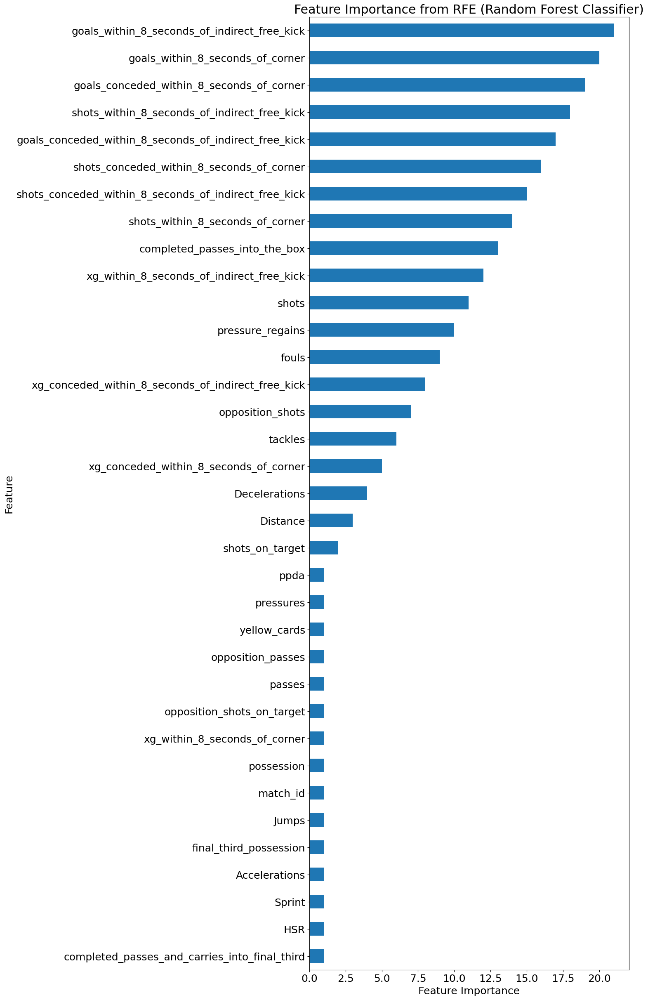

In [164]:
plt.figure(figsize=(10, 30))
feature_ranks.plot(kind='barh')
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Feature Importance from RFE (Random Forest Classifier)')
plt.show()

In [165]:
from sklearn.linear_model import LogisticRegression

In [166]:
lr_model = LogisticRegression()

In [167]:
rfe_logistic = RFE(estimator=lr_model, n_features_to_select=15)

In [168]:
X_rfe_logistic = rfe_logistic.fit_transform(X, y)

In [169]:
feature_ranks_logistic = pd.Series(rfe_logistic.ranking_, index=X.columns)
feature_ranks_logistic.sort_values(ascending=True, inplace=True)
selected_features_logistic = feature_ranks_logistic.index[:15]  # Adjust the number as needed

X_selected_logistic = X[selected_features_logistic]

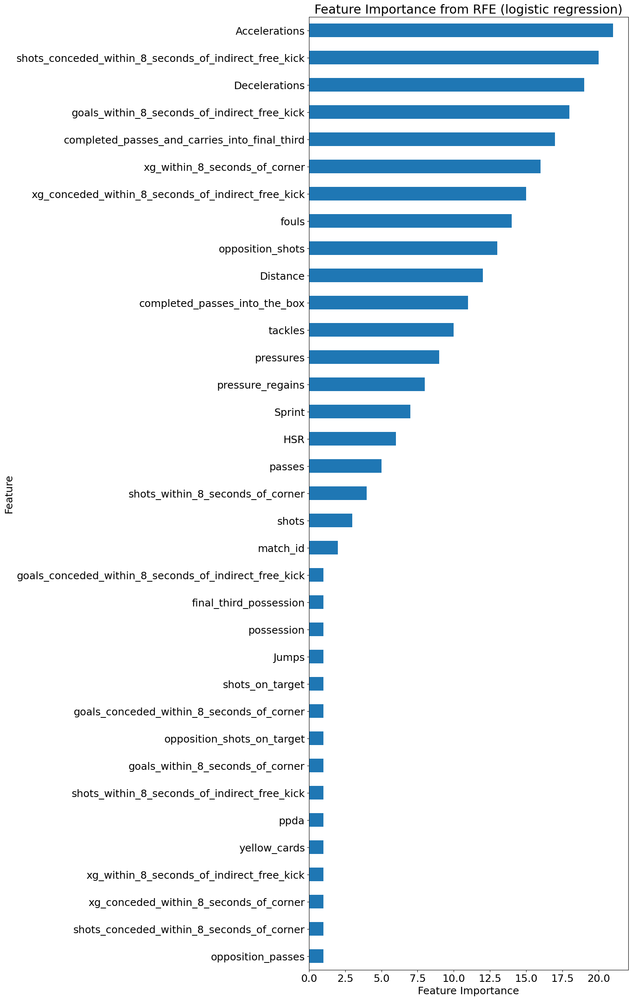

In [171]:
plt.figure(figsize=(10, 30))
feature_ranks_logistic.plot(kind='barh')
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Feature Importance from RFE (logistic regression)')
plt.show()

In [179]:
np.__version__

'2.1.1'